## Loan Interest Rate Prediction
By: Jasmine Tzou

### variables:
1. X1: Interest Rate on the loan  (y, target variable)
2. X2: A unique id for the loan  
3. X3: A unique id assigned for the borrower  
4. X4: Loan amount requested  
5. X5: Loan amount funded  
6. X6: Investor-funded portion of loan  
7. X7: Number of payments (36 or 60)  
8. X8: Loan grade  
9. X9: Loan subgrade  
10. X10: Employer or job title (self-filled)  
11. X11: Number of years employed (0 to 10; 10 = 10 or more) 
12. X12: Home ownership status: RENT, OWN, MORTGAGE, OTHER  
13. X13: Annual income of borrower  
14. X14: Income verified, not verified, or income source was verified  
15. X15: Date loan was issued  
16. X16: Reason for loan provided by borrower  
17. X17: Loan category, as provided by borrower  
18. X18: Loan title, as provided by borrower  
19. X19: First 3 numbers of zip code  
20. X20: State of borrower  
21. X21: A ratio calculated using the borrower's total monthly debt payments on the total debt obligations, excluding mortgage and the requested loan, divided by the borrower's self-reported monthly income  
22. X22: The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years  
23. X23: Date the borrower's earliest reported credit line was opened  
24. X24: Number of inquiries by creditors during the past 6 months  
25. X25: Number of months since the borrower's last delinquency  
26. X26: Number of months since the last public record  
27. X27: Number of open credit lines in the borrower's credit file  
28. X28: Number of derogatory public records  
29. X29: Total credit revolving balance  
30. X30: Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit  
31. X31: The total number of credit lines currently in the borrower's credit file  
32. X32: The initial listing status of the loan. Possible values are: W, F!

#### Import packages

In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import datetime

from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer

# Importing Classifier Modules
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV

#to be abole to view all columns and rows
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

import warnings
warnings.filterwarnings("ignore")

## 1.Data cleaning and preprocessing

### 1.1 Load data

In [3]:
df=pd.read_csv('Data for Cleaning & Modeling.csv',low_memory=False)
df.head(5)

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X25,X26,X27,X28,X29,X30,X31,X32
0,11.89%,54734.0,80364.0,"$25,000","$25,000","$19,080",36 months,B,B4,NaN,< 1 year,RENT,85000.0,VERIFIED - income,Aug-09,Due to a lack of personal finance education an...,debt_consolidation,Debt consolidation for on-time payer,941xx,CA,19.48,0.0,Feb-94,0.0,NaN,NaN,10.0,0.0,28854.0,52.10%,42.0,f
1,10.71%,55742.0,114426.0,"$7,000","$7,000",$673,36 months,B,B5,CNN,< 1 year,RENT,65000.0,not verified,May-08,Just want to pay off the last bit of credit ca...,credit_card,Credit Card payoff,112xx,NY,14.29,0.0,Oct-00,0.0,NaN,NaN,7.0,0.0,33623.0,76.70%,7.0,f
2,16.99%,57167.0,137225.0,"$25,000","$25,000","$24,725",36 months,D,D3,Web Programmer,1 year,RENT,70000.0,VERIFIED - income,Aug-14,Trying to pay a friend back for apartment brok...,debt_consolidation,mlue,100xx,NY,10.50,0.0,Jun-00,0.0,41.0,NaN,10.0,0.0,19878.0,66.30%,17.0,f
3,13.11%,57245.0,138150.0,"$1,200","$1,200","$1,200",36 months,C,C2,city of beaumont texas,10+ years,OWN,54000.0,not verified,Mar-10,"If funded, I would use this loan consolidate t...",debt_consolidation,zxcvb,777xx,TX,5.47,0.0,Jan-85,0.0,64.0,NaN,5.0,0.0,2584.0,40.40%,31.0,f
4,13.57%,57416.0,139635.0,"$10,800","$10,800","$10,692",36 months,C,C3,State Farm Insurance,6 years,RENT,32000.0,not verified,Nov-09,I currently have a personal loan with Citifina...,debt_consolidation,Nicolechr1978,067xx,CT,11.63,0.0,Dec-96,1.0,58.0,NaN,14.0,0.0,3511.0,25.60%,40.0,f


### Rename column name

Change the column name, so that it will be more easy to see

In [4]:
df.columns = ['Interest_Rate', 'loanID', 'borID', 'Loan_Requested', 'Loan_Funded', 'Investor_portion', \
                'Number_of_Payments', 'Loan_Grade','loanSGrade','job', 'Years_Employed', 'Home_Ownership',\
                'Annual_Income', 'Verification', 'Issued_MonYY','reason_Loan', 'loan_Cat','loanTitle', 'zip_3',\
                'State', 'Debit_Payment_Ratio', 'Delinquency_Frequency','Credit_Earliest_MonYY','Inquiries_Count',\
                'Delinquency_Recency', 'Public_Record_Recency','Open_Credit_Line_Count', 'Derogatory_Public_Record_Count',\
                'Total_Credit','Credit_Utilization_Rate','Total_Credit_Line_Count','Initial_Status']

df.head(5)

,Interest_Rate,loanID,borID,Loan_Requested,Loan_Funded,Investor_portion,Number_of_Payments,Loan_Grade,loanSGrade,job,Years_Employed,Home_Ownership,Annual_Income,Verification,Issued_MonYY,reason_Loan,loan_Cat,loanTitle,zip_3,State,Debit_Payment_Ratio,Delinquency_Frequency,Credit_Earliest_MonYY,Inquiries_Count,Delinquency_Recency,Public_Record_Recency,Open_Credit_Line_Count,Derogatory_Public_Record_Count,Total_Credit,Credit_Utilization_Rate,Total_Credit_Line_Count,Initial_Status
0,11.89%,54734.0,80364.0,"$25,000","$25,000","$19,080",36 months,B,B4,NaN,< 1 year,RENT,85000.0,VERIFIED - income,Aug-09,Due to a lack of personal finance education an...,debt_consolidation,Debt consolidation for on-time payer,941xx,CA,19.48,0.0,Feb-94,0.0,NaN,NaN,10.0,0.0,28854.0,52.10%,42.0,f
1,10.71%,55742.0,114426.0,"$7,000","$7,000",$673,36 months,B,B5,CNN,< 1 year,RENT,65000.0,not verified,May-08,Just want to pay off the last bit of credit ca...,credit_card,Credit Card payoff,112xx,NY,14.29,0.0,Oct-00,0.0,NaN,NaN,7.0,0.0,33623.0,76.70%,7.0,f
2,16.99%,57167.0,137225.0,"$25,000","$25,000","$24,725",36 months,D,D3,Web Programmer,1 year,RENT,70000.0,VERIFIED - income,Aug-14,Trying to pay a friend back for apartment brok...,debt_consolidation,mlue,100xx,NY,10.50,0.0,Jun-00,0.0,41.0,NaN,10.0,0.0,19878.0,66.30%,17.0,f
3,13.11%,57245.0,138150.0,"$1,200","$1,200","$1,200",36 months,C,C2,city of beaumont texas,10+ years,OWN,54000.0,not verified,Mar-10,"If funded, I would use this loan consolidate t...",debt_consolidation,zxcvb,777xx,TX,5.47,0.0,Jan-85,0.0,64.0,NaN,5.0,0.0,2584.0,40.40%,31.0,f
4,13.57%,57416.0,139635.0,"$10,800","$10,800","$10,692",36 months,C,C3,State Farm Insurance,6 years,RENT,32000.0,not verified,Nov-09,I currently have a personal loan with Citifina...,debt_consolidation,Nicolechr1978,067xx,CT,11.63,0.0,Dec-96,1.0,58.0,NaN,14.0,0.0,3511.0,25.60%,40.0,f


In [5]:
df.shape

(400000, 32)

#### Mising value
From the chart below, that there's a lot of missing value.
Theoretically, 25% to 30% is the maximum missing values are allowed, beyond which we might want to drop the variable unless that variable is significant to the target variable.

In [6]:
na_count=df.isna().sum()

In [7]:
df_na = pd.DataFrame(na_count)
df_na['NA_count'] = df_na
df_na['NA_%'] = (df_na['NA_count'] / df.shape[0])*100
df_na = df_na.iloc[:,1:3]
df_na

,NA_count,NA_%
Interest_Rate,61010,15.25250
loanID,1,0.00025
borID,1,0.00025
Loan_Requested,1,0.00025
Loan_Funded,1,0.00025
Investor_portion,1,0.00025
Number_of_Payments,1,0.00025
Loan_Grade,61270,15.31750
loanSGrade,61270,15.31750
job,23986,5.99650


### 1.2 Data Preprocessing &  Exploratory Data Analysis

There is 1 row that has no value, except Interest_Rate, will drop the row

In [8]:
df[df.Loan_Requested.isnull()]

,Interest_Rate,loanID,borID,Loan_Requested,Loan_Funded,Investor_portion,Number_of_Payments,Loan_Grade,loanSGrade,job,Years_Employed,Home_Ownership,Annual_Income,Verification,Issued_MonYY,reason_Loan,loan_Cat,loanTitle,zip_3,State,Debit_Payment_Ratio,Delinquency_Frequency,Credit_Earliest_MonYY,Inquiries_Count,Delinquency_Recency,Public_Record_Recency,Open_Credit_Line_Count,Derogatory_Public_Record_Count,Total_Credit,Credit_Utilization_Rate,Total_Credit_Line_Count,Initial_Status
364111,7.69%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df = df.dropna(subset = ['Loan_Requested'],axis =0)

- Interest_Rate: \
Since target variable controls how the learning algorithm learns, it is not advised to impute it. Therefore, will drop the missing values.

In [10]:
df=df.dropna(subset=['Interest_Rate'],axis=0)

- reason_Loan has over 69% of missing value, and the inofrmation is not easy to categorized --> drop it
- Delinquency_Recency has over 54% of missing value --> drop it
- Public_Record_Recency has over 87% of missing value --> drop it

In [11]:
df=df.drop(columns = ['reason_Loan', 'loanTitle','Delinquency_Recency', 'Public_Record_Recency'])

- loanID, borID is the identification of each record, does not help predict the interest rate --> drop it
- Loan_Grade and loanSGrade represent the same thing, therefore, will only keep Loan_Grade since loan subgrade is too complex --> drop loanSGrade
- zip_3 and state both represent the geography information, therefore will only keep state, since zip_3 is too detail--> drop  zip_3

In [12]:
print("Loan_garde count:"+str(len(df.Loan_Grade.value_counts())))
print("Loan_subgarde count:"+str(len(df.loanSGrade.value_counts())))

Loan_garde count:7
Loan_subgarde count:35


In [13]:
df=df.drop(columns = ['loanID', 'borID','loanSGrade','zip_3'])

- job contians job role, description, whch does not contain constant information --> drop it

In [14]:
df=df.drop(columns = ['job'])

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 338989 entries, 0 to 399999
Data columns (total 23 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Interest_Rate                   338989 non-null  object 
 1   Loan_Requested                  338989 non-null  object 
 2   Loan_Funded                     338989 non-null  object 
 3   Investor_portion                338989 non-null  object 
 4   Number_of_Payments              338989 non-null  object 
 5   Loan_Grade                      287123 non-null  object 
 6   Years_Employed                  324195 non-null  object 
 7   Home_Ownership                  287030 non-null  object 
 8   Annual_Income                   287238 non-null  float64
 9   Verification                    338989 non-null  object 
 10  Issued_MonYY                    338989 non-null  object 
 11  loan_Cat                        338989 non-null  object 
 12  State           

#### Interest Rate 

In [16]:
#Interest Rate on the loan
df['Interest_Rate'] =df['Interest_Rate'].str.replace("%","") 
df['Interest_Rate'] = df['Interest_Rate'].astype(float)
#df.Interest_Rate = df.Interest_Rate.replace('(%)','', regex = True).astype(float)

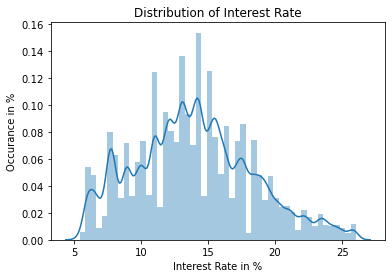

In [17]:
sns.distplot(df['Interest_Rate'])
plt.title("Distribution of Interest Rate")
plt.xlabel("Interest Rate in %")
plt.ylabel("Occurance in %")
plt.show()

From the above plot, we can see that the interest rate has the majority in 15%, and range from around 5% to 27%.

#### Loan_Requested, Loan_Funded, Investor_portion

In [18]:
df.Loan_Requested = df.Loan_Requested.replace('[\$\,]','', regex = True).astype(int)
df.Loan_Funded = df.Loan_Funded.replace('[\$\,]','', regex = True).astype(int)
df.Investor_portion = df.Investor_portion.replace('[\$\,]','', regex = True).astype(int)

count    338989.000000
mean      14276.968353
std        8252.264104
min         500.000000
25%        8000.000000
50%       12000.000000
75%       20000.000000
max       35000.000000
Name: Loan_Requested, dtype: float64


<AxesSubplot:xlabel='Loan_Requested', ylabel='Density'>

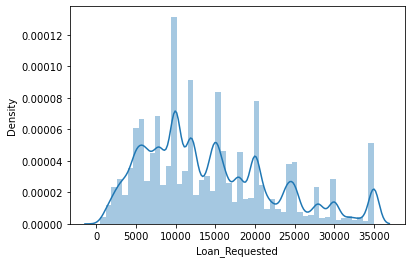

In [19]:
#loan_requested
print(df['Loan_Requested'].describe())
sns.distplot(df[df['Loan_Requested'].notnull()]['Loan_Requested'])

count    338989.000000
mean      14248.306140
std        8238.064335
min         500.000000
25%        8000.000000
50%       12000.000000
75%       20000.000000
max       35000.000000
Name: Loan_Funded, dtype: float64


<AxesSubplot:xlabel='Loan_Funded', ylabel='Density'>

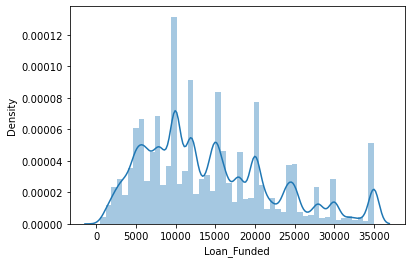

In [20]:
#loan_funded
print(df['Loan_Funded'].describe())
sns.distplot(df[df['Loan_Funded'].notnull()]['Loan_Funded'])

count    338989.000000
mean      14182.000445
std        8255.138412
min           0.000000
25%        8000.000000
50%       12000.000000
75%       19900.000000
max       35000.000000
Name: Investor_portion, dtype: float64


<AxesSubplot:xlabel='Investor_portion', ylabel='Density'>

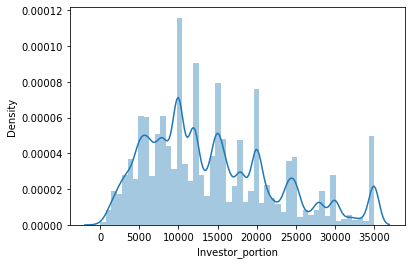

In [21]:
#investor_portion
print(df['Investor_portion'].describe())
sns.distplot(df[df['Investor_portion'].notnull()]['Investor_portion'])

From the above analysis and plots, we can see that Loan_Requested, Loan_Funded, Investor_portion has similar distribution, will further do the correlation plot, to see whether they are highly correlated.

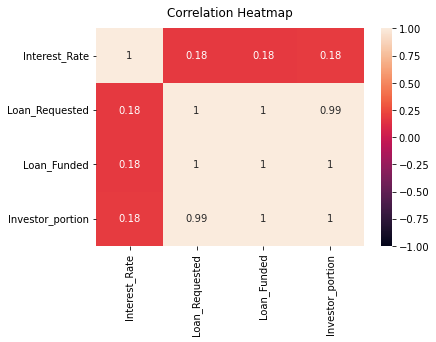

In [22]:
cor=df.iloc[:,0:4]
heatmap = sns.heatmap(cor.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

We can see that there's high correlation (nearly one to one) with the loan_requested, Investor_potion, and loan funded. Therefore, we'll just leave 'loan_requested', since putting them will add dimensionality but do not provide that much extra information.

In [23]:
df=df.drop(['Loan_Funded','Investor_portion'],axis=1)

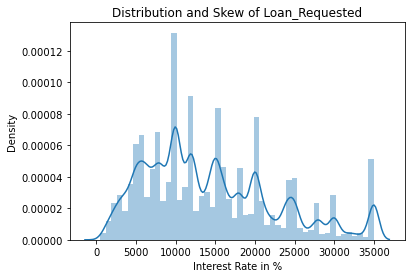

In [24]:
sns.distplot(df['Loan_Requested'])
plt.title("Distribution and Skew of Loan_Requested")
plt.xlabel("Interest Rate in %")
plt.show()

#### Number_of_Payments

In [25]:
df['Number_of_Payments'].value_counts()

 36 months    247791
 60 months     91198
Name: Number_of_Payments, dtype: int64

In [26]:
#create a category variable, based on Number_of_Payments
df['pay_36months'] = df['Number_of_Payments'].apply(lambda x: 1 if x == '36 months' else 0)

In [27]:
df = df.drop('Number_of_Payments', axis=1)

#### Loan_grade

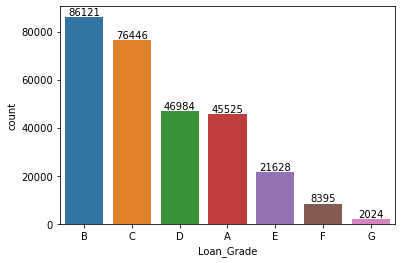

In [28]:
#df['Loan_Grade'].value_counts()
ax = sns.countplot(x=df['Loan_Grade'],order=df['Loan_Grade'].value_counts(ascending=False).index)
abs_values = df['Loan_Grade'].value_counts(ascending=False).values
ax.bar_label(container=ax.containers[0])
plt.show()

since there're 61,270 (about 15%) of missing value in the Loan grade, will create a new category as "others" to inpute the missing values, rather than interpolate them.

In [29]:
df["Loan_Grade"] = df["Loan_Grade"].fillna('Others').astype("category")

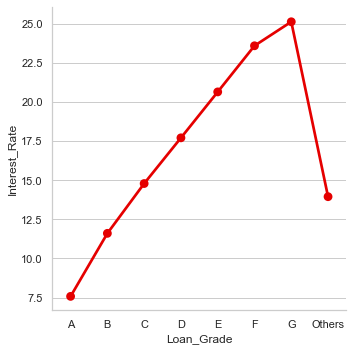

In [30]:
sns.set(style="whitegrid")
g = sns.PairGrid(data=df, x_vars=['Loan_Grade'], y_vars='Interest_Rate', size=5)
g.map(sns.pointplot, color=sns.xkcd_rgb["red"])

From the above plot, we can see that loan grades has high correlation with interest rate.

#### Process Years_Employed 

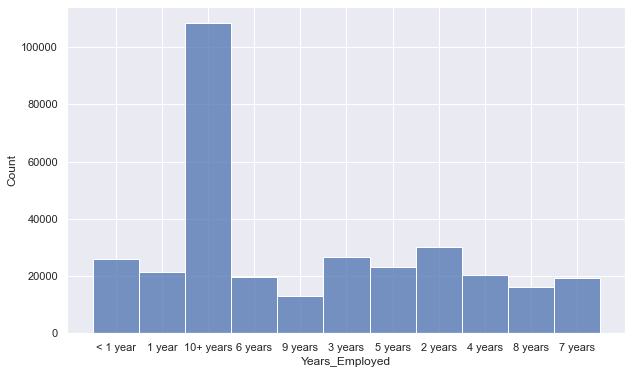

count        324195
unique           11
top       10+ years
freq         108491
Name: Years_Employed, dtype: object

In [31]:
sns.set(rc={"figure.figsize":(10,6)})
sns.histplot(df[df["Years_Employed"].notnull()]["Years_Employed"])
plt.show()
df["Years_Employed"].describe()

In [32]:
#clean the data form and 
df['Years_Employed']= df['Years_Employed'].str.replace('years','').str.replace('year','').str.replace('+','')
df['Years_Employed']= df['Years_Employed'].str.replace('< 1','0')
df['Years_Employed']= df['Years_Employed'].astype('float')

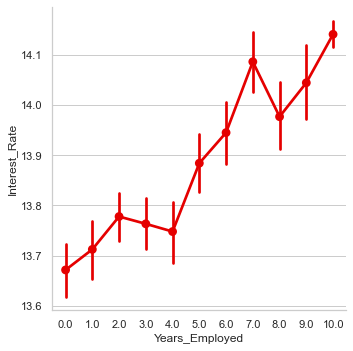

In [33]:
#plot the years employeed and interest rate
sns.set(style="whitegrid")
g = sns.PairGrid(data=df, x_vars=['Years_Employed'], y_vars='Interest_Rate', size=5)
g.map(sns.pointplot, color=sns.xkcd_rgb["red"])

Since there's about 4% of missing value in Years_Employeed, will use interpolate to fill in the missing value

In [34]:
df['Years_Employed']=df['Years_Employed'].interpolate()

Since the 10 represent the years employeed from 10 years to more, will change to category so that each category means a range.

0-4    128696
10     110301
5-9     99992
Name: Years_Employed, dtype: int64
                Interest_Rate
Years_Employed               
0-4                 13.744290
10                  14.143337
5-9                 13.988912


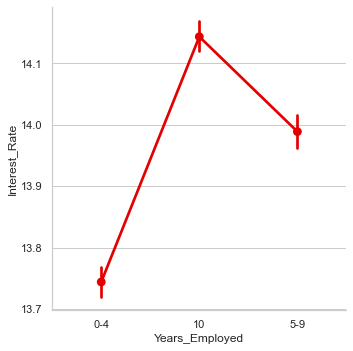

In [35]:
new=['0-4','5-9','10']
df['Years_Employed']= [new[int(x)//5] if x!='Other' else 'Other' for x in df['Years_Employed']]

print(df['Years_Employed'].value_counts())
print(df.groupby('Years_Employed')[['Years_Employed','Interest_Rate']].mean())

sns.set(style="whitegrid")
g = sns.PairGrid(data=df, x_vars=['Years_Employed'], y_vars='Interest_Rate', size=5)
g.map(sns.pointplot, color=sns.xkcd_rgb["red"])

#### Process Home ownership

In [36]:
df['Home_Ownership'].value_counts()

MORTGAGE    145958
RENT        115958
OWN          24976
OTHER          107
NONE            30
ANY              1
Name: Home_Ownership, dtype: int64

In [37]:
df['Home_Ownership']=df['Home_Ownership'].str.replace('NONE','OTHER').str.replace('ANY','OTHER')
df['Home_Ownership']=df['Home_Ownership'].fillna("OTHER")
df['Home_Ownership'] = df['Home_Ownership'].astype("category")
df['Home_Ownership'].value_counts()

MORTGAGE    145958
RENT        115958
OTHER        52097
OWN          24976
Name: Home_Ownership, dtype: int64

<AxesSubplot:xlabel='Home_Ownership', ylabel='count'>

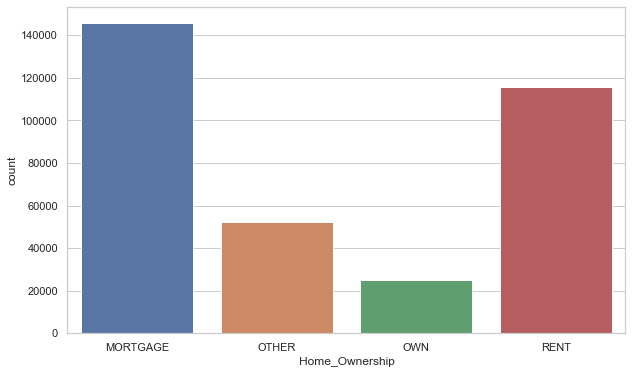

In [38]:
sns.countplot(x='Home_Ownership',data=df)

From the above plot, we can see that mortgage is the majority.

In [39]:
df.groupby('Home_Ownership')[['Home_Ownership','Interest_Rate']].mean()

,Interest_Rate
Home_Ownership,
MORTGAGE,13.662988
OTHER,13.985585
OWN,14.092569
RENT,14.253723


In [40]:
df.shape

(338989, 21)

#### Remove outlier for annual income

In [41]:
df['Annual_Income'].describe()

count    2.872380e+05
mean     7.315146e+04
std      5.618967e+04
min      3.000000e+03
25%      4.500000e+04
50%      6.300000e+04
75%      8.807875e+04
max      7.500000e+06
Name: Annual_Income, dtype: float64

<AxesSubplot:xlabel='Annual_Income', ylabel='Density'>

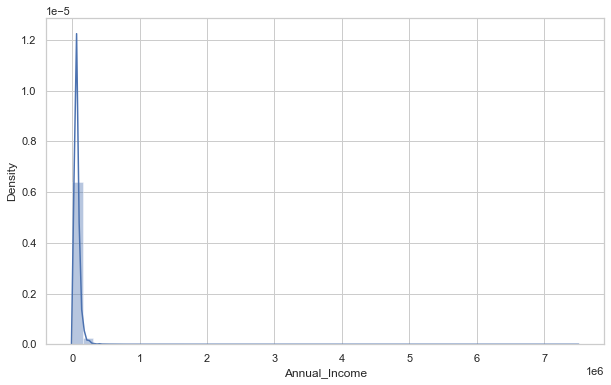

In [42]:
sns.distplot(df[df['Annual_Income'].notnull()]['Annual_Income'])

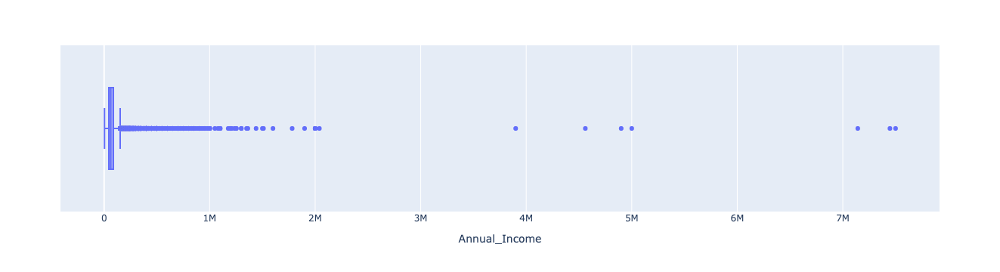

In [43]:
fig = px.box(df, x="Annual_Income")
fig.show()

From the plots above, we can see that there's a few annual income is really high, and since they're 61,028 missing values, in order to not affect too much by these outlier, will remove them which is higher than upper fence($1,526,060), in order to fill in the NAs.

In [44]:
print(len(df[df.Annual_Income>1526060]))

15


In [45]:
#only select which is smaller than 1526060
df= df.loc[~(df['Annual_Income']>1526060)]
df.shape

(338974, 21)

In [46]:
#input na value with interpolate, since it will input value with the nearest distance
df.Annual_Income=df.Annual_Income.interpolate()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 338974 entries, 0 to 399999
Data columns (total 21 columns):
 #   Column                          Non-Null Count   Dtype   
---  ------                          --------------   -----   
 0   Interest_Rate                   338974 non-null  float64 
 1   Loan_Requested                  338974 non-null  int64   
 2   Loan_Grade                      338974 non-null  category
 3   Years_Employed                  338974 non-null  object  
 4   Home_Ownership                  338974 non-null  category
 5   Annual_Income                   338974 non-null  float64 
 6   Verification                    338974 non-null  object  
 7   Issued_MonYY                    338974 non-null  object  
 8   loan_Cat                        338974 non-null  object  
 9   State                           338974 non-null  object  
 10  Debit_Payment_Ratio             338974 non-null  float64 
 11  Delinquency_Frequency           338974 non-null  float64 
 12  Cr

Check the distribution, after removing outlier and input the missing value

<AxesSubplot:xlabel='Annual_Income', ylabel='Density'>

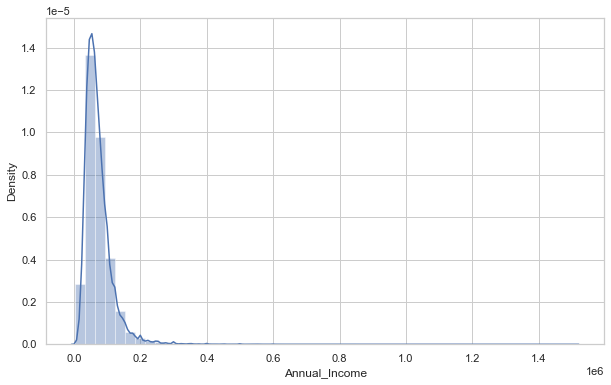

In [47]:
sns.distplot(df['Annual_Income'])

In [48]:
df.shape

(338974, 21)

originally want to use KNN methods to input the NAs, but due to computing limitation can not reach, 
will put code below for reference

In [49]:
#KNN to fill NAs
#https://medium.com/@kyawsawhtoon/a-guide-to-knn-imputation-95e2dc496e
#from sklearn.preprocessing import MinMaxScaler

#scaler = MinMaxScaler()
#df = pd.DataFrame(scaler.fit_transform(df), columns = df.columns)
#df.head()

#from sklearn.impute import KNNImputer
#imputer = KNNImputer(n_neighbors=5)
#df1 = pd.DataFrame(imputer.fit_transform(df1),columns = df1.Annual_Income)

#### Process Verification to category

In [50]:
df['Verification'].value_counts()
df['Verification'] = df['Verification'].astype("category")
df['Verification'].value_counts()

VERIFIED - income           127036
not verified                107868
VERIFIED - income source    104070
Name: Verification, dtype: int64

Since VERIFIED - income and VERIFIED - income source are both menaing they are verified, will combine them to new category "verified"

In [51]:
df["Verification"] = df["Verification"].str.replace("VERIFIED - income", "verified").str.replace("verified source","verified")
df['Verification'].value_counts()

verified        231106
not verified    107868
Name: Verification, dtype: int64

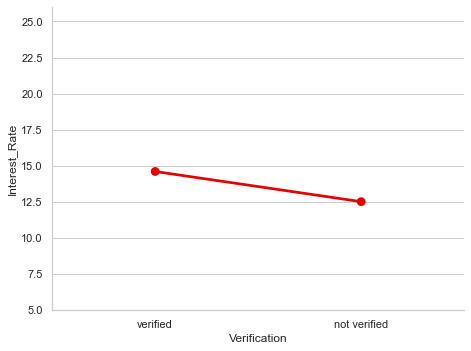

In [52]:
sns.set(style="whitegrid")
i = sns.PairGrid(df, x_vars = ['Verification'], y_vars = 'Interest_Rate', size = 5)
i.map(sns.pointplot, color = sns.xkcd_rgb['red'])
i.fig.set_size_inches(7,5)
i.set(ylim = (5,26));

#### Issued time and credit earliest time, process the time to month, and year the request is issued, and years with credit 

In [53]:
# issued_date
df['issued_month'] = df['Issued_MonYY'].apply(lambda x: str(x)[:3])
df['issued_year'] = df['Issued_MonYY'].apply(lambda x: str(x)[-2:])

# credit_earliest date
df['credit_earliest_month'] = df['Credit_Earliest_MonYY'].apply(lambda x: str(x)[:3])
df['credit_earliest_year'] = df['Credit_Earliest_MonYY'].apply(lambda x: str(x)[-2:])

df = df.drop(['Issued_MonYY', 'Credit_Earliest_MonYY' ], axis=1)

In [54]:
df['issued_month'].unique()

array(['Aug', 'May', 'Mar', 'Nov', 'Apr', 'Sep', 'Feb', 'Dec', 'Jun',
       'Oct', 'Jul', 'Jan'], dtype=object)

In [55]:
df['issued_year'].unique()

array(['09', '08', '14', '10', '12', '07', '11', '13'], dtype=object)

In [56]:
df['credit_earliest_month'].unique()

array(['Feb', 'Oct', 'Jun', 'Jan', 'Dec', 'Apr', 'Nov', 'Jul', 'May',
       'Aug', 'Sep', 'Mar'], dtype=object)

In [57]:
df['credit_earliest_year'].unique()

array(['94', '00', '85', '96', '98', '93', '01', '06', '95', '97', '90',
       '91', '03', '05', '75', '02', '88', '86', '87', '92', '89', '99',
       '04', '83', '80', '84', '71', '63', '81', '76', '82', '79', '72',
       '78', '73', '77', '74', '69', '70', '68', '67', '64', '07', '61',
       '62', '66', '65', '54', '08', '50', '46', '59', '56', '09', '58',
       '60', '10', '55', '53', '57', '11', '44', '51', '49'], dtype=object)

In [58]:
# Define month convertion function
def month(x):
    months = {
        "jan": 1,
        "feb": 2,
        "mar": 3,
        "apr": 4,
        "may": 5,
        "jun": 6,
        "jul": 7,
        "aug": 8,
        "sep": 9,
        "oct": 10,
        "nov": 11,
        "dec": 12,
    }
    try: # convert all the month into lowercase to match them to numbers
        x = months[x.strip()[:3].lower()]
        return x
    except:
        pass

# Define year convertion function
# Since it's only 2023 now, I assume that last 2 digits greater than 30 is in 1900 century
# for last 2 digits less than 30, I assume that it's in 2000 century

def year(x):
    x = x.strip()[-2:]
    try:
        if float(x) > 30: 
            x = "19" + str(x)
        else:             # 
            x = "20" + str(x)
        return int(x)
    except:
        pass

In [59]:
# change issued_date & credit_earliest_date's Month & Year
df['issued_month'] = df['issued_month'].apply(lambda x: month(x))
df['credit_earliest_month']  = df['credit_earliest_month'] .apply(lambda x: month(x))
df['issued_year'] = df['issued_year'].apply(lambda x: year(x))
df['credit_earliest_year'] = df['credit_earliest_year'].apply(lambda x: year(x))

- issued month/year

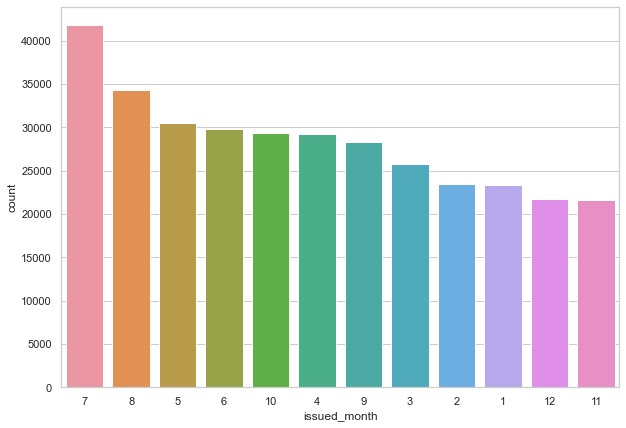

In [60]:
countplt, ax = plt.subplots(figsize = (10,7))

ax = sns.countplot(x='issued_month', 
              data=df,
             order = df['issued_month'].value_counts().index)

From the above plot, we can see that July has the most issued loan cases.

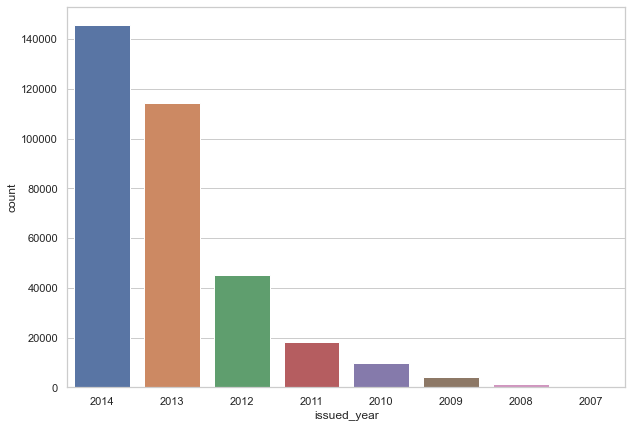

In [61]:
countplt, ax = plt.subplots(figsize = (10,7))

ax = sns.countplot(x='issued_year', 
              data=df,
             order = df['issued_year'].value_counts().index)

From the above plot, we can see that 2014 has the most issued loan cases.

- credit earlist month/year

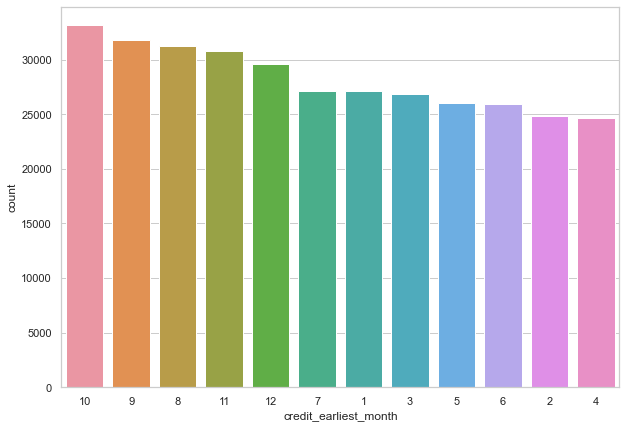

In [62]:
countplt, ax = plt.subplots(figsize = (10,7))

ax = sns.countplot(x='credit_earliest_month', 
              data=df,
             order = df['credit_earliest_month'].value_counts().index)

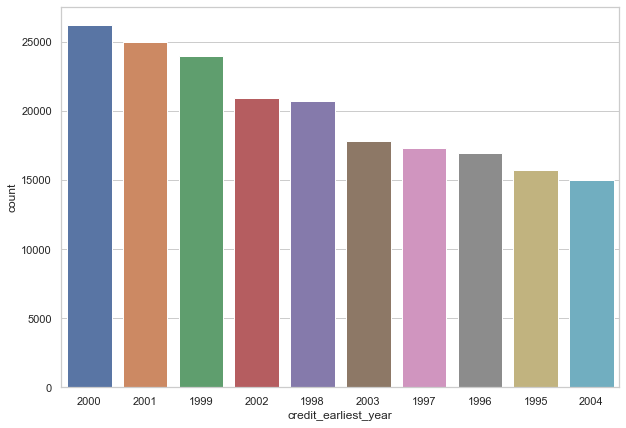

In [63]:
countplt, ax = plt.subplots(figsize = (10,7))

ax = sns.countplot(x='credit_earliest_year', 
              data=df,
             order = df['credit_earliest_year'].value_counts().index[:10])

#### Initial status for the loan request

In [64]:
df['Initial_Status'].value_counts()

f    232588
w    106386
Name: Initial_Status, dtype: int64

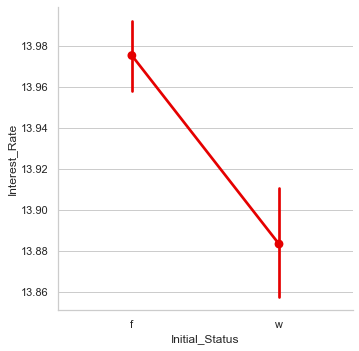

In [65]:
sns.set(style="whitegrid")
g = sns.PairGrid(data=df, x_vars=['Initial_Status'], y_vars='Interest_Rate', size=5)
g.map(sns.pointplot, color=sns.xkcd_rgb["red"])


#### Loan category

In [66]:
df['loan_Cat'].value_counts()
#punc = ['major_purchase','small_business','car','medical','moving','wedding','vacation',]
#for i in punc:
#    a = [x.replace(i,'') for x in a]

debt_consolidation    198217
credit_card            75678
home_improvement       19622
other                  17154
major_purchase          7312
small_business          5359
car                     4115
medical                 3328
moving                  2138
wedding                 1934
vacation                1848
house                   1723
educational              279
renewable_energy         267
Name: loan_Cat, dtype: int64

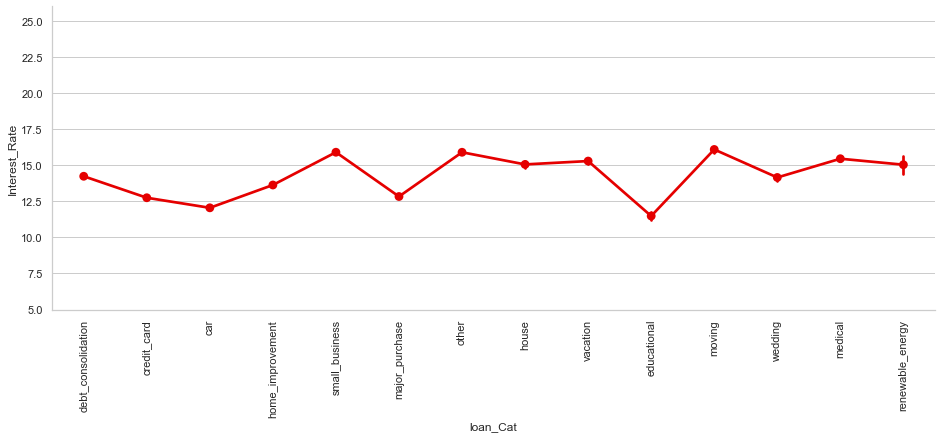

In [67]:
sns.set(style="whitegrid")
i = sns.PairGrid(df, x_vars = ['loan_Cat'], y_vars = 'Interest_Rate', size = 5,
                hue_order= df['Interest_Rate'])
i.map(sns.pointplot, color = sns.xkcd_rgb['red'])
i.fig.set_size_inches(15,5)
for ax in i.axes.flat:
    plt.setp(ax.get_xticklabels(), rotation=90)
i.set(ylim = (5,26));

#### State 

In [68]:
#change satet into 5 regions in US
states = {
    "AK": "Other",
    "AL": "South",
    "AR": "South",
    "AS": "Other",
    "AZ": "West",
    "CA": "West",
    "CO": "West",
    "CT": "Northeast",
    "DC": "Northeast",
    "DE": "Northeast",
    "FL": "South",
    "GA": "South",
    "GU": "Other",
    "HI": "Other",
    "IA": "Midwest",
    "ID": "West",
    "IL": "Midwest",
    "IN": "Midwest",
    "KS": "Midwest",
    "KY": "South",
    "LA": "South",
    "MA": "Northeast",
    "MD": "Northeast",
    "ME": "Northeast",
    "MI": "West",
    "MN": "Midwest",
    "MO": "Midwest",
    "MP": "Other",
    "MS": "South",
    "MT": "West",
    "NA": "Other",
    "NC": "South",
    "ND": "Midwest",
    "NE": "West",
    "NH": "Northeast",
    "NJ": "Northeast",
    "NM": "West",
    "NV": "West",
    "NY": "Northeast",
    "OH": "Midwest",
    "OK": "South",
    "OR": "West",
    "PA": "Northeast",
    "PR": "Other",
    "RI": "Northeast",
    "SC": "South",
    "SD": "Midwest",
    "TN": "South",
    "TX": "South",
    "UT": "West",
    "VA": "South",
    "VI": "Other",
    "VT": "Northeast",
    "WA": "West",
    "WI": "Midwest",
    "WV": "South",
    "WY": "West",
}


df["Region"] = df["State"].map(states)

df = df.drop("State", axis=1)

In [69]:
df["Region"] = df["Region"].astype("category")

In [70]:
df['Region'].value_counts()

South        107299
West          99157
Northeast     81302
Midwest       48471
Other          2745
Name: Region, dtype: int64

In [71]:
#df1.groupby('State')[['State','Interest_Rate']].mean()
df.groupby('Region')[['Region','Interest_Rate']].mean()
#the interest rate in west is slightly lower than other region

,Interest_Rate
Region,
Midwest,13.942030
Northeast,13.938972
Other,14.446179
South,13.981531
West,13.902650


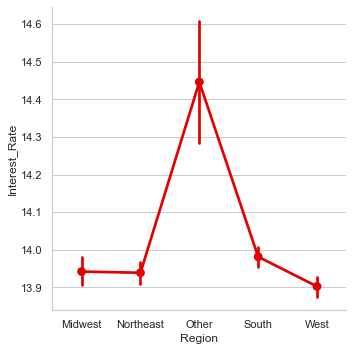

In [72]:
#visualization on the 
sns.set(style="whitegrid")
g = sns.PairGrid(data=df, x_vars=['Region'], y_vars='Interest_Rate', size=5)
g.map(sns.pointplot, color=sns.xkcd_rgb["red"])

#### Debit_Payment_Ratio

count    338974.000000
mean         16.997916
std           7.696701
min           0.000000
25%          11.250000
50%          16.700000
75%          22.500000
max          39.990000
Name: Debit_Payment_Ratio, dtype: float64

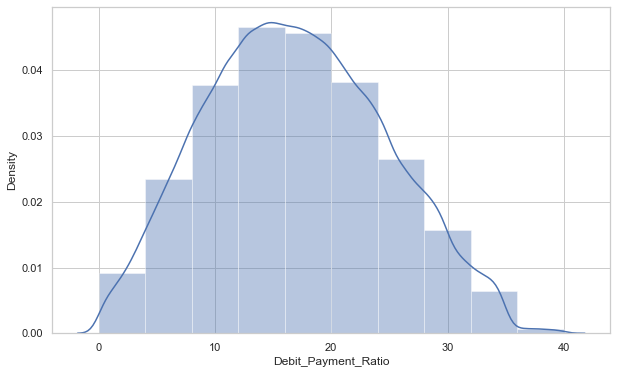

In [73]:
sns.distplot(df[['Debit_Payment_Ratio']]['Debit_Payment_Ratio'],bins = 10);
df['Debit_Payment_Ratio'].describe()

#### delinquency_frequency

In [74]:
df['Delinquency_Frequency'].value_counts()

0.0     280238
1.0      39793
2.0      11493
3.0       3964
4.0       1658
5.0        841
6.0        441
7.0        226
8.0        111
9.0         68
10.0        48
11.0        27
12.0        23
13.0        13
18.0         6
14.0         6
16.0         5
15.0         4
17.0         3
19.0         2
24.0         1
29.0         1
22.0         1
21.0         1
Name: Delinquency_Frequency, dtype: int64

count    338974.000000
mean          0.274284
std           0.779301
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          29.000000
Name: Delinquency_Frequency, dtype: float64

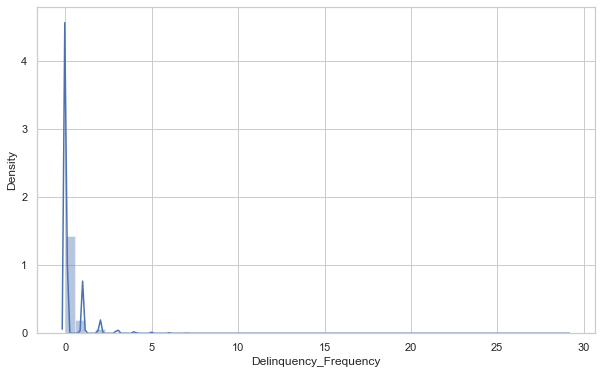

In [75]:
sns.distplot(df[['Delinquency_Frequency']]['Delinquency_Frequency']);
df['Delinquency_Frequency'].describe()

since there's 228,206 is 0 requency, which accounts for about 82% of the data, therefore, will trun this column into categorical, turn numbers other than 0 into 1.

In [76]:
df['has_delinquency'] = df['Delinquency_Frequency'].apply(lambda x: 1 if x != 0 else 0)
df['has_delinquency']=df['has_delinquency'].astype("category")
df = df.drop(columns = ['Delinquency_Frequency'])

In [77]:
df['has_delinquency'].value_counts()

0    280238
1     58736
Name: has_delinquency, dtype: int64

#### Process Open_Credit_Line_Count

In [78]:
df['Open_Credit_Line_Count'].describe()

count    338974.000000
mean         11.117991
std           4.896049
min           0.000000
25%           8.000000
50%          10.000000
75%          14.000000
max          76.000000
Name: Open_Credit_Line_Count, dtype: float64

<AxesSubplot:xlabel='Open_Credit_Line_Count', ylabel='Density'>

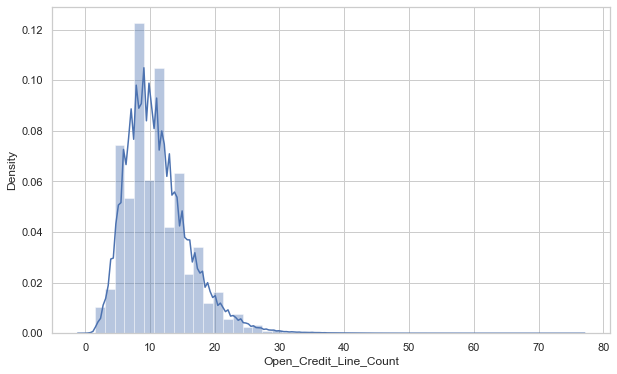

In [79]:
#df.hist(column = 'Open_Credit_Line_Count')
sns.distplot(df['Open_Credit_Line_Count'])

From the above plot and description of the column, we know that the data is right-skewed, and the min=0, therefore, will apply log transformation for this column.

In [80]:
df['log_Open_Credit_Line_Count'] = np.log10(df['Open_Credit_Line_Count'])
df['log_Open_Credit_Line_Count'] .replace([-np.inf], 0, inplace = True)
df=df.drop("Open_Credit_Line_Count", axis=1)
df.head(5)

,Interest_Rate,Loan_Requested,Loan_Grade,Years_Employed,Home_Ownership,Annual_Income,Verification,loan_Cat,Debit_Payment_Ratio,Inquiries_Count,Derogatory_Public_Record_Count,Total_Credit,Credit_Utilization_Rate,Total_Credit_Line_Count,Initial_Status,pay_36months,issued_month,issued_year,credit_earliest_month,credit_earliest_year,Region,has_delinquency,log_Open_Credit_Line_Count
0,11.89,25000,B,0-4,RENT,85000.0,verified,debt_consolidation,19.48,0.0,0.0,28854.0,52.10%,42.0,f,0,8,2009,2,1994,West,0,1.000000
1,10.71,7000,B,0-4,RENT,65000.0,not verified,credit_card,14.29,0.0,0.0,33623.0,76.70%,7.0,f,0,5,2008,10,2000,Northeast,0,0.845098
2,16.99,25000,D,0-4,RENT,70000.0,verified,debt_consolidation,10.50,0.0,0.0,19878.0,66.30%,17.0,f,0,8,2014,6,2000,Northeast,0,1.000000
3,13.11,1200,C,10,OWN,54000.0,not verified,debt_consolidation,5.47,0.0,0.0,2584.0,40.40%,31.0,f,0,3,2010,1,1985,South,0,0.698970
4,13.57,10800,C,5-9,RENT,32000.0,not verified,debt_consolidation,11.63,1.0,0.0,3511.0,25.60%,40.0,f,0,11,2009,12,1996,Northeast,0,1.146128


<AxesSubplot:xlabel='log_Open_Credit_Line_Count', ylabel='Density'>

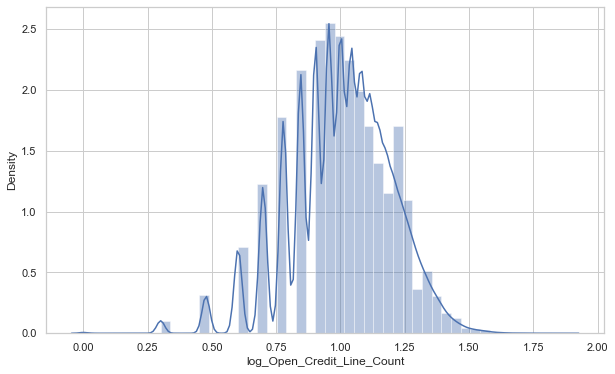

In [81]:
sns.distplot(df['log_Open_Credit_Line_Count'])

In [82]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 338974 entries, 0 to 399999
Data columns (total 23 columns):
 #   Column                          Non-Null Count   Dtype   
---  ------                          --------------   -----   
 0   Interest_Rate                   338974 non-null  float64 
 1   Loan_Requested                  338974 non-null  int64   
 2   Loan_Grade                      338974 non-null  category
 3   Years_Employed                  338974 non-null  object  
 4   Home_Ownership                  338974 non-null  category
 5   Annual_Income                   338974 non-null  float64 
 6   Verification                    338974 non-null  object  
 7   loan_Cat                        338974 non-null  object  
 8   Debit_Payment_Ratio             338974 non-null  float64 
 9   Inquiries_Count                 338974 non-null  float64 
 10  Derogatory_Public_Record_Count  338974 non-null  float64 
 11  Total_Credit                    338974 non-null  float64 
 12  Cr

#### Process Derogatory_Public_Record_Count

In [83]:
df['Derogatory_Public_Record_Count'].value_counts()

0.0     296216
1.0      37292
2.0       3668
3.0       1076
4.0        346
5.0        186
6.0         89
7.0         47
8.0         19
9.0         11
10.0        10
11.0         3
13.0         2
49.0         1
54.0         1
17.0         1
34.0         1
21.0         1
63.0         1
40.0         1
18.0         1
14.0         1
Name: Derogatory_Public_Record_Count, dtype: int64

In [84]:
df.groupby('Derogatory_Public_Record_Count')[['Interest_Rate']].mean()

,Interest_Rate
Derogatory_Public_Record_Count,
0.0,13.810919
1.0,14.775732
2.0,15.631284
3.0,15.564907
4.0,15.963699
5.0,15.638763
6.0,15.097079
7.0,15.042766
8.0,16.267368


Since most of the data of the number of derogatory public records is 0(about 66%), will convert the data to categorical: other than 0 will be 1.

In [85]:
df['has_derogatory'] = df['Derogatory_Public_Record_Count'].apply(lambda x: 1 if x != 0 else 0)
df['has_derogatory']=df['has_derogatory'].astype("category")
df = df.drop(columns = ['Derogatory_Public_Record_Count'])

In [86]:
df['has_derogatory'].value_counts()

0    296216
1     42758
Name: has_derogatory, dtype: int64

#### Process Total_Credit

In [87]:
df['Total_Credit'].describe()

count    3.389740e+05
mean     1.596715e+04
std      1.961100e+04
min      0.000000e+00
25%      6.462000e+03
50%      1.178150e+04
75%      2.023300e+04
max      2.568995e+06
Name: Total_Credit, dtype: float64

<AxesSubplot:xlabel='Total_Credit', ylabel='Density'>

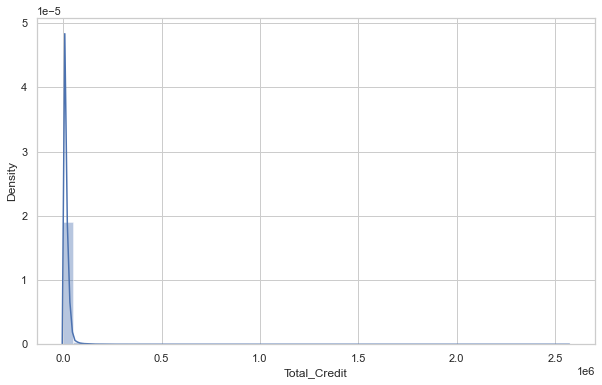

In [88]:
sns.distplot(df['Total_Credit'])

Since the total credit within the dataset has a lot of huge numbers, will define those numbers as outliers, and remove them if they are greater than 40889.

In [89]:
df = df[df['Total_Credit'] <= 40889]

In [90]:
df.shape

(323200, 23)

#### Process Credit_Utilization_Rate

In [91]:
df['Credit_Utilization_Rate'] = df['Credit_Utilization_Rate'].str.replace("%","")
#for col in ["Credit_Utilization_Rate"]:
#    df[col] = df[col].str.slice(stop=-1).astype("float")

df['Credit_Utilization_Rate']= pd.to_numeric(df['Credit_Utilization_Rate'])
df['Credit_Utilization_Rate'].describe()

count    322998.000000
mean         55.811935
std          23.726311
min           0.000000
25%          38.900000
50%          57.200000
75%          74.300000
max         892.300000
Name: Credit_Utilization_Rate, dtype: float64

In [92]:
df['Credit_Utilization_Rate'].isna().sum()

202

Since there's only 202 missing value in 'Credit_Utilization_Rate', which is less than 0.1% of the data, will fill with mean.

In [93]:
mean_value=df['Credit_Utilization_Rate'].mean()

In [94]:
df.loc['Credit_Utilization_Rate']=df['Credit_Utilization_Rate'].fillna(value=mean_value, inplace=True)

In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 323201 entries, 0 to Credit_Utilization_Rate
Data columns (total 23 columns):
 #   Column                      Non-Null Count   Dtype   
---  ------                      --------------   -----   
 0   Interest_Rate               323200 non-null  float64 
 1   Loan_Requested              323200 non-null  float64 
 2   Loan_Grade                  323200 non-null  category
 3   Years_Employed              323200 non-null  object  
 4   Home_Ownership              323200 non-null  category
 5   Annual_Income               323200 non-null  float64 
 6   Verification                323200 non-null  object  
 7   loan_Cat                    323200 non-null  object  
 8   Debit_Payment_Ratio         323200 non-null  float64 
 9   Inquiries_Count             323200 non-null  float64 
 10  Total_Credit                323200 non-null  float64 
 11  Credit_Utilization_Rate     323200 non-null  float64 
 12  Total_Credit_Line_Count     323200 non-null  f

#### Process Total_Credit_Line_Count

In [96]:
df['Total_Credit_Line_Count'].describe()

count    323200.000000
mean         24.633846
std          11.356222
min           2.000000
25%          16.000000
50%          23.000000
75%          31.000000
max         118.000000
Name: Total_Credit_Line_Count, dtype: float64

<AxesSubplot:xlabel='Total_Credit_Line_Count', ylabel='Density'>

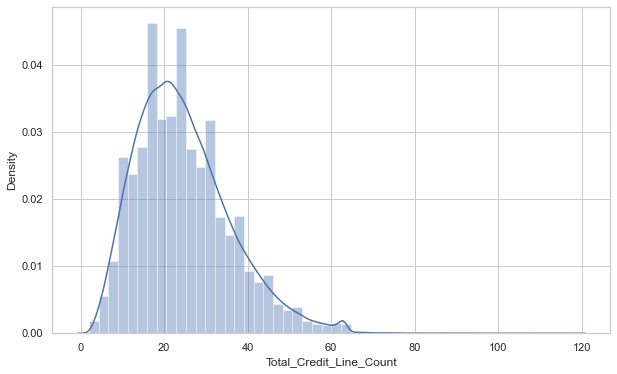

In [97]:
sns.distplot(df['Total_Credit_Line_Count'])

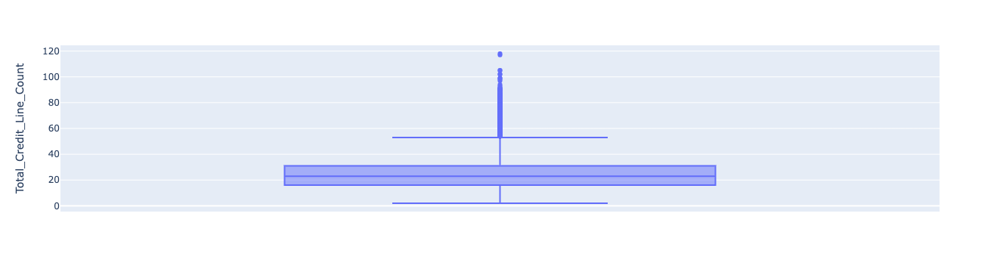

In [98]:
fig = px.box(df, y="Total_Credit_Line_Count")
fig.show()

In [99]:
df = df[df['Total_Credit_Line_Count'] <= 53]
df.shape

(317178, 23)

#### Initial status 

In [100]:
df['Initial_Status'].value_counts()

f    218272
w     98906
Name: Initial_Status, dtype: int64

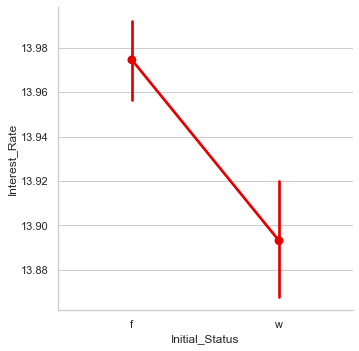

In [101]:
df.groupby('Initial_Status')[['Initial_Status','Interest_Rate']].mean()
#plot
sns.set(style="whitegrid")
g = sns.PairGrid(data=df, x_vars=['Initial_Status'], y_vars='Interest_Rate', size=5)
g.map(sns.pointplot, color=sns.xkcd_rgb["red"])

In [102]:
df['Initial_Status']=df['Initial_Status'].astype("category")

In [103]:
df.isna().sum()

Interest_Rate                 0
Loan_Requested                0
Loan_Grade                    0
Years_Employed                0
Home_Ownership                0
Annual_Income                 0
Verification                  0
loan_Cat                      0
Debit_Payment_Ratio           0
Inquiries_Count               0
Total_Credit                  0
Credit_Utilization_Rate       0
Total_Credit_Line_Count       0
Initial_Status                0
pay_36months                  0
issued_month                  0
issued_year                   0
credit_earliest_month         0
credit_earliest_year          0
Region                        0
has_delinquency               0
log_Open_Credit_Line_Count    0
has_derogatory                0
dtype: int64

### 1.3 One-hot encoding

In [104]:
#get dummies variables
df = pd.get_dummies(df, drop_first=True)
df.head()

,Interest_Rate,Loan_Requested,Annual_Income,Debit_Payment_Ratio,Inquiries_Count,Total_Credit,Credit_Utilization_Rate,Total_Credit_Line_Count,pay_36months,issued_month,issued_year,credit_earliest_month,credit_earliest_year,log_Open_Credit_Line_Count,Loan_Grade_B,Loan_Grade_C,Loan_Grade_D,Loan_Grade_E,Loan_Grade_F,Loan_Grade_G,Loan_Grade_Others,Years_Employed_10,Years_Employed_5-9,Home_Ownership_OTHER,Home_Ownership_OWN,Home_Ownership_RENT,Verification_verified,loan_Cat_credit_card,loan_Cat_debt_consolidation,loan_Cat_educational,loan_Cat_home_improvement,loan_Cat_house,loan_Cat_major_purchase,loan_Cat_medical,loan_Cat_moving,loan_Cat_other,loan_Cat_renewable_energy,loan_Cat_small_business,loan_Cat_vacation,loan_Cat_wedding,Initial_Status_w,Region_Northeast,Region_Other,Region_South,Region_West,has_delinquency_1,has_derogatory_1
0,11.89,25000.0,85000.0,19.48,0.0,28854.0,52.1,42.0,0.0,8.0,2009.0,2.0,1994.0,1.000000,1,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,10.71,7000.0,65000.0,14.29,0.0,33623.0,76.7,7.0,0.0,5.0,2008.0,10.0,2000.0,0.845098,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,16.99,25000.0,70000.0,10.50,0.0,19878.0,66.3,17.0,0.0,8.0,2014.0,6.0,2000.0,1.000000,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,13.11,1200.0,54000.0,5.47,0.0,2584.0,40.4,31.0,0.0,3.0,2010.0,1.0,1985.0,0.698970,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,13.57,10800.0,32000.0,11.63,1.0,3511.0,25.6,40.0,0.0,11.0,2009.0,12.0,1996.0,1.146128,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [105]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 317178 entries, 0 to 399999
Data columns (total 47 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Interest_Rate                317178 non-null  float64
 1   Loan_Requested               317178 non-null  float64
 2   Annual_Income                317178 non-null  float64
 3   Debit_Payment_Ratio          317178 non-null  float64
 4   Inquiries_Count              317178 non-null  float64
 5   Total_Credit                 317178 non-null  float64
 6   Credit_Utilization_Rate      317178 non-null  float64
 7   Total_Credit_Line_Count      317178 non-null  float64
 8   pay_36months                 317178 non-null  float64
 9   issued_month                 317178 non-null  float64
 10  issued_year                  317178 non-null  float64
 11  credit_earliest_month        317178 non-null  float64
 12  credit_earliest_year         317178 non-null  float64
 13  log_

## 2. Train/Test data split

In [106]:
X, y = df.drop("Interest_Rate", axis=1), df["Interest_Rate"]

In [107]:
(x_train, x_test, y_train, y_test) = train_test_split( X, y, test_size=0.2, random_state=1)

## 3. Data modeling

In [108]:
# Import DecisionTreeRegressor from sklearn.tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error as MSE

### 3.1  linear Regression

In [109]:
lr = LinearRegression()
# Fit 'linear' to the training set
lr.fit(x_train, y_train)

# Predict the test set labels 'y_pred'
lr_y_pred_test = lr.predict(x_test)
lr_y_pred_train = lr.predict(x_train)

lr_MSE_CV_scores = -cross_val_score(
    lr, x_train, y_train, cv=10, scoring="neg_mean_squared_error", n_jobs=-1
)
# Evaluate the test set RMSE
lr_rmse_train = MSE(y_train, lr_y_pred_train) ** (1 / 2)
lr_rmse_test = MSE(y_test, lr_y_pred_test) ** (1 / 2)
lr_RMSE_CV = (lr_MSE_CV_scores.mean()) ** (1 / 2)

# Print the test set RMSE
print("Train set RMSE of rf: {:.2f}".format(lr_rmse_train))
print("Test set RMSE of rf: {:.2f}".format(lr_rmse_test))
print("CV RMSE: {:.2f}".format(lr_RMSE_CV))

Train set RMSE of rf: 1.93
Test set RMSE of rf: 1.95
CV RMSE: 1.94


In [110]:
lr.score(x_train, y_train)

0.8029651645841578

In [111]:
lr.score(x_test, y_test)

0.8005115397963584

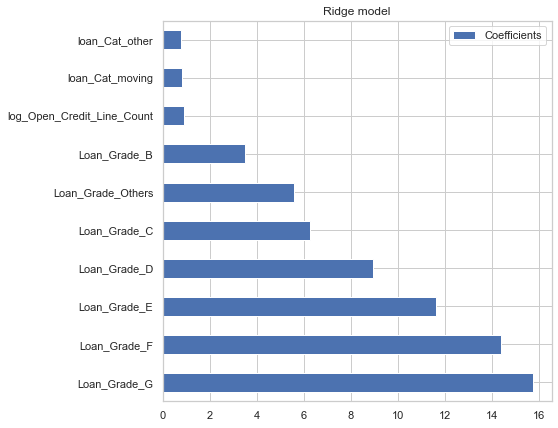

In [112]:
#feature importance
importances = pd.DataFrame(
    lr.coef_, columns=["Coefficients"], index=x_train.columns)
importances = importances.sort_values(by='Coefficients', ascending=False)[:10]

importances.plot(kind="barh", figsize=(9, 7))
plt.title("Ridge model")
plt.axvline(x=0, color=".5")
plt.subplots_adjust(left=0.3)

### 3.2 Random forest

In [113]:
# Instantiate a random forests regressor 'rf' 400 estimators
rf = RandomForestRegressor(n_estimators=400, min_samples_leaf=0.1)
# Fit 'rf' to the training set
rf.fit(x_train, y_train)

# Predict the test set labels 'y_pred'
rf_y_pred_test = rf.predict(x_test)
rf_y_pred_train = rf.predict(x_train)
rf_MSE_CV_scores = -cross_val_score(
    rf, x_train, y_train, cv=10, scoring="neg_mean_squared_error", n_jobs=-1
)
# Evaluate the test set RMSE
rf_rmse_test = MSE(y_test, rf_y_pred_test) ** (1 / 2)
rf_rmse_train = MSE(y_train, rf_y_pred_train) ** (1 / 2)
rf_RMSE_CV = (rf_MSE_CV_scores.mean()) ** (1 / 2)

# Print the test set RMSE
print("Train set RMSE of rf: {:.2f}".format(rf_rmse_train))
print("Test set RMSE of rf: {:.2f}".format(rf_rmse_test))
print("CV RMSE: {:.2f}".format(rf_RMSE_CV))

Train set RMSE of rf: 3.85
Test set RMSE of rf: 3.85
CV RMSE: 3.85


In [114]:
rf.score(x_train, y_train)

0.21902267701298417

In [115]:
rf.score(x_test, y_test)

0.2210991610064318

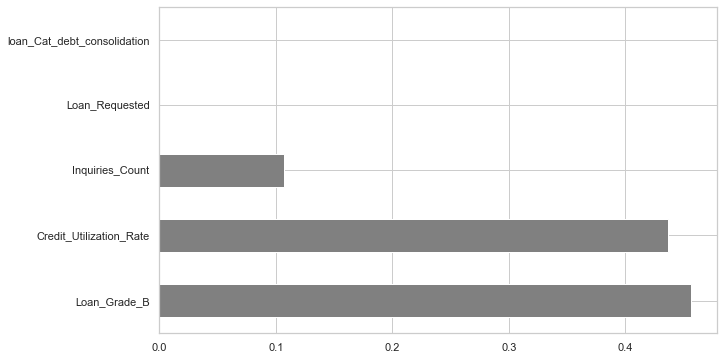

In [116]:
importances_rf = pd.Series(rf.feature_importances_, index=X.columns)
# Sort importances_rf
sorted_importances_rf = importances_rf.sort_values(ascending=False).head()
# Make a horizontal bar plot
sorted_importances_rf.plot(kind="barh", color=".5")
plt.show()

### 3.3 Decision tree

In [117]:
dt = DecisionTreeRegressor(max_depth=15, min_samples_leaf=0.1, random_state=6)
# Fit dt to the training set
dt.fit(x_train, y_train)


# Predict the labels of the training set
dt_y_pred_train = dt.predict(x_train)
dt_y_pred_test = dt.predict(x_test)
dt_MSE_CV_scores = -cross_val_score(
    dt, x_train, y_train, cv=10, scoring="neg_mean_squared_error", n_jobs=-1
)

# Evaluate the training set RMSE of dt
dt_RMSE_train = (MSE(y_train, dt_y_pred_train)) ** (1 / 2)
dt_RMSE_test = (MSE(y_test, dt_y_pred_test)) ** (1 / 2)
dt_RMSE_CV = (dt_MSE_CV_scores.mean()) ** (1 / 2)

# Print RMSE score
print("Train RMSE: {:.2f}".format(dt_RMSE_train))
print("Test RMSE of dt: {:.2f}".format(dt_RMSE_test))
print("CV RMSE: {:.2f}".format(dt_RMSE_CV))

Train RMSE: 3.64
Test RMSE of dt: 3.64
CV RMSE: 3.64


In [118]:
dt.score(x_train, y_train)

0.3008469440519915

In [119]:
dt.score(x_test, y_test)

0.30341919246493654

### 3.3.1 Decision tree parameter tuning: max_depth=40, min_samples_leaf=0.05

In [120]:
dt1 = DecisionTreeRegressor(max_depth=40, min_samples_leaf=0.05, random_state=6)
# Fit dt to the training set
dt1.fit(x_train, y_train)

# Predict the labels 
dt1_y_pred_train = dt1.predict(x_train)
dt1_y_pred_test = dt1.predict(x_test)
# Compute the array containing the 10-folds CV MSEs
dt1_MSE_CV_scores = -cross_val_score(
    dt1, x_train, y_train, cv=10, scoring="neg_mean_squared_error", n_jobs=-1
)

# Evaluate the training set RMSE of dt
dt1_RMSE_train = (MSE(y_train, dt1_y_pred_train)) ** (1 / 2)
dt1_RMSE_test = (MSE(y_test, dt1_y_pred_test)) ** (1 / 2)
dt1_RMSE_CV = (dt1_MSE_CV_scores.mean()) ** (1 / 2)

# Print RMSE_train
print("Train RMSE: {:.2f}".format(dt1_RMSE_train))
print("Test RMSE of dt: {:.2f}".format(dt1_RMSE_test))
print("CV RMSE: {:.2f}".format(dt1_RMSE_CV))

Train RMSE: 2.98
Test RMSE of dt: 2.96
CV RMSE: 2.98


In [121]:
dt1.score(x_train, y_train)

0.5335649314897272

In [122]:
dt1.score(x_test, y_test)

0.539498205910132

### 3.4 GradientBoostingRegressor

In [123]:
gb = GradientBoostingRegressor(max_depth=10, n_estimators=200, random_state=2)
# Fit gb to the training set
gb.fit(x_train, y_train)

# Predict labels
gb_y_pred_train = gb.predict(x_train)
gb_y_pred_test = gb.predict(x_test)
# Compute the array containing the 10-folds CV MSEs
gb_MSE_CV_scores = -cross_val_score(
    dt1, x_train, y_train, cv=10, scoring="neg_mean_squared_error", n_jobs=-1
)


# Evaluate the RMSE of gb
gb_RMSE_train = (MSE(y_train, gb_y_pred_train)) ** (1 / 2)
gb_RMSE_test = (MSE(y_test, gb_y_pred_test)) ** (1 / 2)
# Compute the 10-folds CV RMSE
gb_RMSE_CV = (gb_MSE_CV_scores.mean()) ** (1 / 2)

# Print RMSE score
print("Train RMSE: {:.2f}".format(gb_RMSE_train))
print("Test RMSE of dt: {:.2f}".format(gb_RMSE_test))
print("CV RMSE: {:.2f}".format(gb_RMSE_CV))

Train RMSE: 1.09
Test RMSE of dt: 1.51
CV RMSE: 2.98


In [124]:
gb.score(x_train, y_train)

0.9369237979514815

In [125]:
gb.score(x_test, y_test)

0.8805048689825804

### Apply to test data
#### apply all methods use in train data, to test data


In [126]:
test = pd.read_csv('Holdout for Testing.csv')
#rename column name
test.columns = ['Interest_Rate', 'loanID', 'borID', 'Loan_Requested', 'Loan_Funded', 'Investor_portion', \
                'Number_of_Payments', 'Loan_Grade','loanSGrade','job', 'Years_Employed', 'Home_Ownership',\
                'Annual_Income', 'Verification', 'Issued_MonYY','reason_Loan', 'loan_Cat','loanTitle', 'zip_3',\
                'State', 'Debit_Payment_Ratio', 'Delinquency_Frequency','Credit_Earliest_MonYY','Inquiries_Count',\
                'Delinquency_Recency', 'Public_Record_Recency','Open_Credit_Line_Count', 'Derogatory_Public_Record_Count',\
                'Total_Credit','Credit_Utilization_Rate','Total_Credit_Line_Count','Initial_Status']

test.head(5)

,Interest_Rate,loanID,borID,Loan_Requested,Loan_Funded,Investor_portion,Number_of_Payments,Loan_Grade,loanSGrade,job,Years_Employed,Home_Ownership,Annual_Income,Verification,Issued_MonYY,reason_Loan,loan_Cat,loanTitle,zip_3,State,Debit_Payment_Ratio,Delinquency_Frequency,Credit_Earliest_MonYY,Inquiries_Count,Delinquency_Recency,Public_Record_Recency,Open_Credit_Line_Count,Derogatory_Public_Record_Count,Total_Credit,Credit_Utilization_Rate,Total_Credit_Line_Count,Initial_Status
0,NaN,44409194,47416907,"$6,000","$6,000","$6,000",36 months,C,C5,Electrician,10+ years,MORTGAGE,68000.0,VERIFIED - income,15-Mar,NaN,debt_consolidation,Debt consolidation,430xx,OH,28.31,0,2-Nov,1,26.0,NaN,18,0,19861,64.50%,33,f
1,NaN,44017917,47034722,"$24,000","$24,000","$24,000",36 months,A,A1,Executive Assistant,8 years,RENT,110480.0,VERIFIED - income,15-Mar,NaN,debt_consolidation,Debt consolidation,945xx,CA,16.03,0,Dec-68,1,NaN,NaN,12,0,17001,26.20%,36,w
2,NaN,44259158,47306871,"$35,000","$35,000","$35,000",36 months,C,C2,District Sales Leader,10+ years,MORTGAGE,86000.0,VERIFIED - income,15-Mar,NaN,debt_consolidation,Debt consolidation,195xx,PA,32.49,0,Oct-98,0,NaN,NaN,16,0,25797,49.90%,33,w
3,NaN,44429213,47476932,"$10,000","$10,000","$10,000",60 months,D,D1,pharmacy associate,10+ years,RENT,30000.0,VERIFIED - income source,15-Mar,NaN,debt_consolidation,Debt consolidation,921xx,CA,32.96,0,Feb-99,1,NaN,114.0,13,1,9586,43.80%,21,w
4,NaN,44299188,47346901,"$24,000","$24,000","$24,000",60 months,B,B1,Medical case manager,10+ years,MORTGAGE,82500.0,VERIFIED - income,15-Mar,NaN,debt_consolidation,Debt consolidation,196xx,PA,31.03,0,2-Dec,0,48.0,NaN,27,0,31842,41.30%,43,w


In [127]:
#drop interest_rate in the test data
test = test.drop("Interest_Rate", axis=1)

In [128]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80000 entries, 0 to 79999
Data columns (total 31 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   loanID                          80000 non-null  int64  
 1   borID                           80000 non-null  int64  
 2   Loan_Requested                  80000 non-null  object 
 3   Loan_Funded                     80000 non-null  object 
 4   Investor_portion                80000 non-null  object 
 5   Number_of_Payments              80000 non-null  object 
 6   Loan_Grade                      80000 non-null  object 
 7   loanSGrade                      80000 non-null  object 
 8   job                             75606 non-null  object 
 9   Years_Employed                  75618 non-null  object 
 10  Home_Ownership                  80000 non-null  object 
 11  Annual_Income                   80000 non-null  float64
 12  Verification                    

In [129]:
# drop variables that are not predictive to target variable
test=test.drop(columns = ['reason_Loan', 'loanTitle','Delinquency_Recency', 'Public_Record_Recency'])
test=test.drop(columns = ['loanID', 'borID','loanSGrade','zip_3'])
test=test.drop(columns = ['job'])

In [130]:
#Loan_Requested, Loan_Funded,Investor_portion
test.Loan_Requested = test.Loan_Requested.replace('[\$\,]','', regex = True).astype(int)
test.Loan_Funded = test.Loan_Funded.replace('[\$\,]','', regex = True).astype(int)
test.Investor_portion = test.Investor_portion.replace('[\$\,]','', regex = True).astype(int)

test=test.drop(['Loan_Funded','Investor_portion'],axis=1)

In [131]:
# Number_of_Payments
test['pay_36months'] = test['Number_of_Payments'].apply(lambda x: 1 if x == '36 months' else 0)
test = test.drop('Number_of_Payments', axis=1)

In [132]:
#loan grade
test["Loan_Grade"] = test["Loan_Grade"].fillna('Others').astype("category")

In [133]:
#Years_Employed
test['Years_Employed']= test['Years_Employed'].str.replace('years','').str.replace('year','').str.replace('+','')
test['Years_Employed']= test['Years_Employed'].str.replace('< 1','0')
test['Years_Employed']= test['Years_Employed'].astype('float')

test['Years_Employed']=test['Years_Employed'].interpolate()
new=['0-4','5-9','10']
test['Years_Employed']= [new[int(x)//5] if x!='Other' else 'Other' for x in test['Years_Employed']]

In [134]:
#Home_Ownership
test['Home_Ownership']=test['Home_Ownership'].str.replace('NONE','OTHER').str.replace('ANY','OTHER')
test['Home_Ownership']=test['Home_Ownership'].fillna("OTHER")
test['Home_Ownership'] = test['Home_Ownership'].astype("category")

Found that the pattern for this test data is different from the original data

In [136]:
test = test.sort_values("Credit_Earliest_MonYY").reset_index()
test["Credit_Earliest_MonYY"][30000:35000]

30000     7-Jan
30001     7-Jan
30002     7-Jan
30003     7-Jan
30004     7-Jan
30005     7-Jan
30006     7-Jan
30007     7-Jan
30008     7-Jan
30009     7-Jan
30010     7-Jan
30011     7-Jan
30012     7-Jan
30013     7-Jan
30014     7-Jan
30015     7-Jan
30016     7-Jan
30017     7-Jan
30018     7-Jan
30019     7-Jan
30020     7-Jan
30021     7-Jan
30022     7-Jan
30023     7-Jan
30024     7-Jan
30025     7-Jan
30026     7-Jan
30027     7-Jan
30028     7-Jan
30029     7-Jan
30030     7-Jan
30031     7-Jan
30032     7-Jan
30033     7-Jan
30034     7-Jan
30035     7-Jan
30036     7-Jan
30037     7-Jan
30038     7-Jan
30039     7-Jan
30040     7-Jan
30041     7-Jan
30042     7-Jan
30043     7-Jan
30044     7-Jan
30045     7-Jan
30046     7-Jan
30047     7-Jan
30048     7-Jan
30049     7-Jan
30050     7-Jan
30051     7-Jan
30052     7-Jan
30053     7-Jan
30054     7-Jan
30055     7-Jan
30056     7-Jan
30057     7-Jan
30058     7-Jan
30059     7-Jan
30060     7-Jan
30061     7-Jan
30062   

From the above, you can see that there's a difference of datatype for Credit_Earliest_MonYY.

In [137]:
# credit_earliest date
test["Credit_Earliest_MonYY"][:34017] = test["Credit_Earliest_MonYY"][:34017].apply(
    lambda x: datetime.strptime(str(x + "-22"), "%d-%b-%y"))

test["Credit_Earliest_MonYY"][34017:] = test["Credit_Earliest_MonYY"][34017:].apply(
    lambda x: datetime.strptime(str(x), "%b-%y"))

In [138]:
test['credit_earliest_month'] = pd.to_datetime(test['Credit_Earliest_MonYY']).dt.month
test['credit_earliest_year']  = pd.to_datetime(test['Credit_Earliest_MonYY']).dt.year
test['credit_earliest_year']  = test['credit_earliest_year'].apply(lambda x: str(x)[-2:]).astype("int")

In [139]:
# issued_date
test['issued_month'] = test['Issued_MonYY'].apply(lambda x: str(x)[-3:])
test['issued_year'] = test['Issued_MonYY'].apply(lambda x: str(x)[:2])

test['issued_month'] = test['issued_month'].apply(lambda x: month(x))
test['issued_year'] = test['issued_year'].apply(lambda x: year(x))
test['issued_year'] = test['issued_year'].apply(lambda x: str(x)[-2:]).astype("int")

In [140]:
test=test.drop(columns = ["Credit_Earliest_MonYY","Issued_MonYY","index"])

In [141]:
test.head()

,Loan_Requested,Loan_Grade,Years_Employed,Home_Ownership,Annual_Income,Verification,loan_Cat,State,Debit_Payment_Ratio,Delinquency_Frequency,Inquiries_Count,Open_Credit_Line_Count,Derogatory_Public_Record_Count,Total_Credit,Credit_Utilization_Rate,Total_Credit_Line_Count,Initial_Status,pay_36months,credit_earliest_month,credit_earliest_year,issued_month,issued_year
0,30000,C,10,MORTGAGE,150000.0,verified,debt_consolidation,MD,14.24,0,1,17,0,20383,87.50%,34,w,0,4,22,2,15
1,12000,A,5-9,MORTGAGE,105000.0,not verified,credit_card,HI,8.53,1,0,8,0,30372,58%,28,f,0,4,22,2,15
2,20000,B,10,MORTGAGE,85000.0,verified,debt_consolidation,MA,17.52,0,0,7,0,18035,87.50%,18,w,0,4,22,2,15
3,9000,A,10,MORTGAGE,56000.0,verified,debt_consolidation,CA,6.24,2,0,11,0,5547,55.50%,16,w,0,4,22,2,15
4,11000,B,5-9,RENT,80000.0,not verified,debt_consolidation,CA,17.16,6,0,13,0,2651,39%,33,f,0,4,22,1,15


In [142]:
test.isna().sum()

Loan_Requested                     0
Loan_Grade                         0
Years_Employed                     0
Home_Ownership                     0
Annual_Income                      0
Verification                       0
loan_Cat                           0
State                              0
Debit_Payment_Ratio                0
Delinquency_Frequency              0
Inquiries_Count                    0
Open_Credit_Line_Count             0
Derogatory_Public_Record_Count     0
Total_Credit                       0
Credit_Utilization_Rate           30
Total_Credit_Line_Count            0
Initial_Status                     0
pay_36months                       0
credit_earliest_month              0
credit_earliest_year               0
issued_month                       0
issued_year                        0
dtype: int64

In [143]:
#change State to Region
test["Region"] = test["State"].map(states)
test = test.drop("State", axis=1)

In [144]:
# change Delinquency_Frequency to has_delinquency
test['has_delinquency'] = test['Delinquency_Frequency'].apply(lambda x: 1 if x != 0 else 0)
test['has_delinquency']=test['has_delinquency'].astype("category")
test = test.drop(columns = ['Delinquency_Frequency'])

In [145]:
# change Open_Credit_Line_Count to log_Open_Credit_Line_Count
test['log_Open_Credit_Line_Count'] = np.log10(test['Open_Credit_Line_Count'])
test['log_Open_Credit_Line_Count'] .replace([-np.inf], 0, inplace = True)
test=test.drop("Open_Credit_Line_Count", axis=1)

In [146]:
#Derogatory_Public_Record_Count
test['has_derogatory'] = test['Derogatory_Public_Record_Count'].apply(lambda x: 1 if x != 0 else 0)
test['has_derogatory']=test['has_derogatory'].astype("category")
test = test.drop(columns = ['Derogatory_Public_Record_Count'])

In [147]:
# Credit_Utilization_Rate
test['Credit_Utilization_Rate'] = test['Credit_Utilization_Rate'].str.replace("%","")
test['Credit_Utilization_Rate']= pd.to_numeric(test['Credit_Utilization_Rate'])

test_mean_value=test['Credit_Utilization_Rate'].mean()
test.loc['Credit_Utilization_Rate']=test['Credit_Utilization_Rate'].fillna(value=test_mean_value, inplace=True)

In [148]:
# Total_Credit_Line_Count
#test = test[test['Total_Credit_Line_Count'] <= 53]

In [149]:
test.isna().sum()

Loan_Requested                1
Loan_Grade                    1
Years_Employed                1
Home_Ownership                1
Annual_Income                 1
Verification                  1
loan_Cat                      1
Debit_Payment_Ratio           1
Inquiries_Count               1
Total_Credit                  1
Credit_Utilization_Rate       1
Total_Credit_Line_Count       1
Initial_Status                1
pay_36months                  1
credit_earliest_month         1
credit_earliest_year          1
issued_month                  1
issued_year                   1
Region                        1
has_delinquency               1
log_Open_Credit_Line_Count    1
has_derogatory                1
dtype: int64

In [150]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 80001 entries, 0 to Credit_Utilization_Rate
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Loan_Requested              80000 non-null  float64
 1   Loan_Grade                  80000 non-null  object 
 2   Years_Employed              80000 non-null  object 
 3   Home_Ownership              80000 non-null  object 
 4   Annual_Income               80000 non-null  float64
 5   Verification                80000 non-null  object 
 6   loan_Cat                    80000 non-null  object 
 7   Debit_Payment_Ratio         80000 non-null  float64
 8   Inquiries_Count             80000 non-null  float64
 9   Total_Credit                80000 non-null  float64
 10  Credit_Utilization_Rate     80000 non-null  float64
 11  Total_Credit_Line_Count     80000 non-null  float64
 12  Initial_Status              80000 non-null  object 
 13  pay_36months      

In [151]:
# Get one-hot encoding
test = pd.get_dummies(test, drop_first=True)
test.head()

,Loan_Requested,Annual_Income,Debit_Payment_Ratio,Inquiries_Count,Total_Credit,Credit_Utilization_Rate,Total_Credit_Line_Count,pay_36months,credit_earliest_month,credit_earliest_year,issued_month,issued_year,has_delinquency,log_Open_Credit_Line_Count,has_derogatory,Loan_Grade_B,Loan_Grade_C,Loan_Grade_D,Loan_Grade_E,Loan_Grade_F,Loan_Grade_G,Years_Employed_10,Years_Employed_5-9,Home_Ownership_OWN,Home_Ownership_RENT,Verification_verified,loan_Cat_credit_card,loan_Cat_debt_consolidation,loan_Cat_home_improvement,loan_Cat_house,loan_Cat_major_purchase,loan_Cat_medical,loan_Cat_moving,loan_Cat_other,loan_Cat_renewable_energy,loan_Cat_small_business,loan_Cat_vacation,loan_Cat_wedding,Initial_Status_w,Region_Northeast,Region_Other,Region_South,Region_West
0,30000.0,150000.0,14.24,1.0,20383.0,87.5,34.0,0.0,4.0,22.0,2.0,15.0,0.0,1.230449,0.0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
1,12000.0,105000.0,8.53,0.0,30372.0,58.0,28.0,0.0,4.0,22.0,2.0,15.0,1.0,0.903090,0.0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,20000.0,85000.0,17.52,0.0,18035.0,87.5,18.0,0.0,4.0,22.0,2.0,15.0,0.0,0.845098,0.0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
3,9000.0,56000.0,6.24,0.0,5547.0,55.5,16.0,0.0,4.0,22.0,2.0,15.0,1.0,1.041393,0.0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
4,11000.0,80000.0,17.16,0.0,2651.0,39.0,33.0,0.0,4.0,22.0,1.0,15.0,1.0,1.113943,0.0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [152]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 80001 entries, 0 to Credit_Utilization_Rate
Data columns (total 43 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Loan_Requested               80000 non-null  float64
 1   Annual_Income                80000 non-null  float64
 2   Debit_Payment_Ratio          80000 non-null  float64
 3   Inquiries_Count              80000 non-null  float64
 4   Total_Credit                 80000 non-null  float64
 5   Credit_Utilization_Rate      80000 non-null  float64
 6   Total_Credit_Line_Count      80000 non-null  float64
 7   pay_36months                 80000 non-null  float64
 8   credit_earliest_month        80000 non-null  float64
 9   credit_earliest_year         80000 non-null  float64
 10  issued_month                 80000 non-null  float64
 11  issued_year                  80000 non-null  float64
 12  has_delinquency              80000 non-null  float64
 13  log

In [153]:
test[test.Loan_Requested.isnull()]
test = test.dropna(subset = ['Loan_Requested'],axis =0)

In [154]:
#check the columns difference
col1 = list(test.columns)
col2 = list(df.columns)

In [155]:
for c in df.columns:
    if c not in test.columns:
        print(c)

Interest_Rate
Loan_Grade_Others
Home_Ownership_OTHER
loan_Cat_educational


In [156]:
# filling in the missing columns and fill in 0, 1 values according to the proportion in training set
test['Loan_Grade_Others'] = np.random.choice([0, 1], size=len(test), p=[0.85, 0.15])
test['Home_Ownership_OTHER'] = np.random.choice([0, 1], size=len(test), p=[0.84, 0.16])
test['loan_Cat_educational'] = np.random.choice([0, 1], size=len(test), p=[0.99, 0.01])

In [157]:
print(test.shape)
print(df.shape)

(80000, 46)
(317178, 47)


In [158]:
df.columns

Index(['Interest_Rate', 'Loan_Requested', 'Annual_Income',
       'Debit_Payment_Ratio', 'Inquiries_Count', 'Total_Credit',
       'Credit_Utilization_Rate', 'Total_Credit_Line_Count', 'pay_36months',
       'issued_month', 'issued_year', 'credit_earliest_month',
       'credit_earliest_year', 'has_delinquency', 'log_Open_Credit_Line_Count',
       'has_derogatory', 'Loan_Grade_B', 'Loan_Grade_C', 'Loan_Grade_D',
       'Loan_Grade_E', 'Loan_Grade_F', 'Loan_Grade_G', 'Loan_Grade_Others',
       'Years_Employed_10', 'Years_Employed_5-9', 'Home_Ownership_OTHER',
       'Home_Ownership_OWN', 'Home_Ownership_RENT', 'Verification_verified',
       'loan_Cat_credit_card', 'loan_Cat_debt_consolidation',
       'loan_Cat_educational', 'loan_Cat_home_improvement', 'loan_Cat_house',
       'loan_Cat_major_purchase', 'loan_Cat_medical', 'loan_Cat_moving',
       'loan_Cat_other', 'loan_Cat_renewable_energy',
       'loan_Cat_small_business', 'loan_Cat_vacation', 'loan_Cat_wedding',
       'Initia

In [159]:
test.columns

Index(['Loan_Requested', 'Annual_Income', 'Debit_Payment_Ratio',
       'Inquiries_Count', 'Total_Credit', 'Credit_Utilization_Rate',
       'Total_Credit_Line_Count', 'pay_36months', 'credit_earliest_month',
       'credit_earliest_year', 'issued_month', 'issued_year',
       'has_delinquency', 'log_Open_Credit_Line_Count', 'has_derogatory',
       'Loan_Grade_B', 'Loan_Grade_C', 'Loan_Grade_D', 'Loan_Grade_E',
       'Loan_Grade_F', 'Loan_Grade_G', 'Years_Employed_10',
       'Years_Employed_5-9', 'Home_Ownership_OWN', 'Home_Ownership_RENT',
       'Verification_verified', 'loan_Cat_credit_card',
       'loan_Cat_debt_consolidation', 'loan_Cat_home_improvement',
       'loan_Cat_house', 'loan_Cat_major_purchase', 'loan_Cat_medical',
       'loan_Cat_moving', 'loan_Cat_other', 'loan_Cat_renewable_energy',
       'loan_Cat_small_business', 'loan_Cat_vacation', 'loan_Cat_wedding',
       'Initial_Status_w', 'Region_Northeast', 'Region_Other', 'Region_South',
       'Region_West', 'Loan_

In [160]:
col=['Loan_Requested', 'Annual_Income',
       'Debit_Payment_Ratio', 'Inquiries_Count', 'Total_Credit',
       'Credit_Utilization_Rate', 'Total_Credit_Line_Count', 'pay_36months',
       'issued_month', 'issued_year', 'credit_earliest_month',
       'credit_earliest_year', 'has_delinquency', 'log_Open_Credit_Line_Count',
       'has_derogatory', 'Loan_Grade_B', 'Loan_Grade_C', 'Loan_Grade_D',
       'Loan_Grade_E', 'Loan_Grade_F', 'Loan_Grade_G', 'Loan_Grade_Others',
       'Years_Employed_10', 'Years_Employed_5-9', 'Home_Ownership_OTHER',
       'Home_Ownership_OWN', 'Home_Ownership_RENT', 'Verification_verified',
       'loan_Cat_credit_card', 'loan_Cat_debt_consolidation',
       'loan_Cat_educational', 'loan_Cat_home_improvement', 'loan_Cat_house',
       'loan_Cat_major_purchase', 'loan_Cat_medical', 'loan_Cat_moving',
       'loan_Cat_other', 'loan_Cat_renewable_energy',
       'loan_Cat_small_business', 'loan_Cat_vacation', 'loan_Cat_wedding',
       'Initial_Status_w', 'Region_Northeast', 'Region_Other', 'Region_South',
       'Region_West']

In [161]:
test = test[col]

### Apply linear model

In [162]:
test_pred = lr.predict(test)

test = pd.read_csv("Holdout for Testing.csv")
predict = pd.DataFrame(
    {"Loan_Id": test["X2"], "Predicted_Interest_Rate": test_pred}
)

In [163]:
# "Titanic Results from" *insert your name or UChicago net ID.
predict.to_csv("Loan_Results_YichinTzou.csv", index=False)

#### Summary

From the above 4 machine learning models, we choose Linear regression model, since it performed without underfitting/overfitting problem, and has lowest RMSE comparing other 3 models.
Yet, Since the linear regression has low RMSE=1.82, meaning that there's still a lot of progress can be done in the future,such as doing more work on parameter tuning. From the GB testing, we can know that there's underfitting situation, since the TRAIN RMSE~CV RMSE>TEST RMSE, which we will also work on in the furture. Also another big learning, always check the testing data you're handling, there might be other thing that you didn't handle in the previous step of cleaning.

Things I learned:
1. Start with exploratory data analysis, and check the missing value first
2. Check the test data's outcome, since it might not be the same as training data.